# <center>M2 DAC -   Reinforcement Learning & Advanced Deep</center>
##  <center> TME 9. Generative Adversarial Networks  </center>

Ce TME a pour objectif d'expérimenter les Generative Adversarial Networks (GANs) sur un problème de génération de visages. 

De manière classique, un GAN se formule selon un problème adverse de la manière suivante: 
$$\min\limits_{G} \max\limits_D V(D,G) = \mathbb{E}_{x\sim p_{data}(x)}\big[logD(x)\big] + \mathbb{E}_{z\sim p_{z}(z)}\big[log(1-D(G(z)))\big]$$
Cette formulation met en jeu deux réseaux adverse: 
*   Un réseau discriminateur $D$, dont l'objectif est de savoir distinguer les données réelles des données simulées  
*   Un réseau générateur $G$, dont l'objectif est de flouer le discriminateur

À l'optimum, avec des réseaux de capacité infinie, la distribution $p_G$ des données générées par $G$ est prouvée suivre la distribution des données réelles $p_{data}$. Bien sûr nous ne travaillons pas avec des réseaux de capacité infinie (et d'ailleurs heureusement car on ne veut pas apprendre par coeur les données d'apprentissage), mais l'objectif est d'approcher cette distribution $p_{data}$ en apprenant un générateur neuronal dont les sorties sont difficilement distinguables des vraies données pour le discriminateur. 

Nous proposons de mettre ce genre d'architecture pour un la génération de visages: selon un ensemble de visages d'entraînement, il s'agit d'apprendre à générer des visages qui paraissent les plus réalistes possibles tout en conservant une certaine diversité dans les distributions de sortie. Pour cela nous emploierons une architecture DCGAN, qui utilise des réseaux de neurones convolutionnels (CNNs) pour le générateur et le discriminateur.    


 



Pour ce TP, nous vous proposons de travailler avec Google Colab qui est un service notebook en ligne avec ressources machines à disposition (nécessite d'être connecté à un compte google personnel):
*   https://colab.research.google.com/
*   Ouvrir ce Notebook avec "File>Upload Notebook"
*   Sélectionner un Runtime GPU : Runtime>Change Runtime Type (utile de le faire avant tout téléchargement de données car le changement de Runtime efface les données temporaires de la session)

Pour télécharger les données utiles au TP: 


*   Aller à l'adresse : https://drive.google.com/open?id=0B7EVK8r0v71pWEZsZE9oNnFzTm8
*   Clic-droit sur CelebA, Ajouter à mon Drive
*   Exécuter le code ci-dessous (une autorisation vous sera demandée, suivre le lien donné à l'exécution pour obtenir le code d'authentification)

(Sinon vous pouvez aussi travailler en local en téléchargeant les données sur votre ordinateur mais attention fichier volumineux et colab propose des ressources GPU utiles à la résolution du TP)

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


Vous devez maintenant avoir dans le paneau de gauche un onglet Files contenant un répertoire drive dans l'arborescence. C'est votre espace de stockage Google Drive. Il devrait contenir un répertoire CelebA (si ce n'est pas le cas attendre un peu et rafraichir, il peut mettre un certain temps à apparaître). 

Il s'agit maintenant de décompresser l'archive téléchargée (cela peut prendre jusqu'à une dizaine de minutes): 



In [3]:
# !unzip drive/MyDrive/img_align_celeba.zip -d data
# !unzip drive/MyDrive/M2A/M2A/RLD/TP/TP9_GAN/img_align_celeba.zip -d data
!unzip drive/MyDrive/M2A/RLD/TP/TP9_GAN/img_align_celeba.zip -d data


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
 extracting: data/img_align_celeba/197600.jpg  
 extracting: data/img_align_celeba/197601.jpg  
 extracting: data/img_align_celeba/197602.jpg  
 extracting: data/img_align_celeba/197603.jpg  
 extracting: data/img_align_celeba/197604.jpg  
 extracting: data/img_align_celeba/197605.jpg  
 extracting: data/img_align_celeba/197606.jpg  
 extracting: data/img_align_celeba/197607.jpg  
 extracting: data/img_align_celeba/197608.jpg  
 extracting: data/img_align_celeba/197609.jpg  
 extracting: data/img_align_celeba/197610.jpg  
 extracting: data/img_align_celeba/197611.jpg  
 extracting: data/img_align_celeba/197612.jpg  
 extracting: data/img_align_celeba/197613.jpg  
 extracting: data/img_align_celeba/197614.jpg  
 extracting: data/img_align_celeba/197615.jpg  
 extracting: data/img_align_celeba/197616.jpg  
 extracting: data/img_align_celeba/197617.jpg  
 extracting: data/img_align_celeba/197618.jpg  
 extractin

Cela produit un répertoire data à la racine du repertoire temporaire de votre Google Colab. Ce repertoire contient un sous-repertoire img_align_celeba contenant une liste de 202599 fichiers jpg correspondant à des photos de visages de célébrités (attention ce repertoire est temporaire, tout ce qui n'est pas dans un drive est effacé à la fin de la session). 



In [4]:

import numpy as np
try:
    import torch
except:
    !pip3 install torch==1.2.0+cu92 torchvision==0.4.0+cu92 -f https://download.pytorch.org/whl/torch_stable.html
    import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import torch.utils.data
import torchvision.datasets as dset
import torchvision.utils as vutils
import torch.backends.cudnn as cudnn

from torch.utils.tensorboard import SummaryWriter


Le code ci-dessous permet de déclarer la manière de charger les données. 

Lorsque des données sont demandées (pour la construction d'un nouveau batch par exemple), une série de transformations est appliquée sur les images, selon la composition de transformateurs déclarée pour le chargement: 
*    redimentionnement des images en 64 par 64
*    recadrage au centre (qui ne fait rien ici car image déjà dans la taille du cadre mais si utile pour d'autres paramètres)
*    conversion en tenseur pytorch 
*    normalisation des valeurs RGB selon une moyenne de 0.5 et un ecart-type de 0.5.



In [5]:
image_size = 64
dataset = dset.ImageFolder(root="data",
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

In [6]:
print(dataset)

Dataset ImageFolder
    Number of datapoints: 202599
    Root location: data
    StandardTransform
Transform: Compose(
               Resize(size=64, interpolation=bilinear, max_size=None, antialias=None)
               CenterCrop(size=(64, 64))
               ToTensor()
               Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
           )


Le code ci-dessous permet de déclarer la manière de charger les images et en affiche un échantillon. 

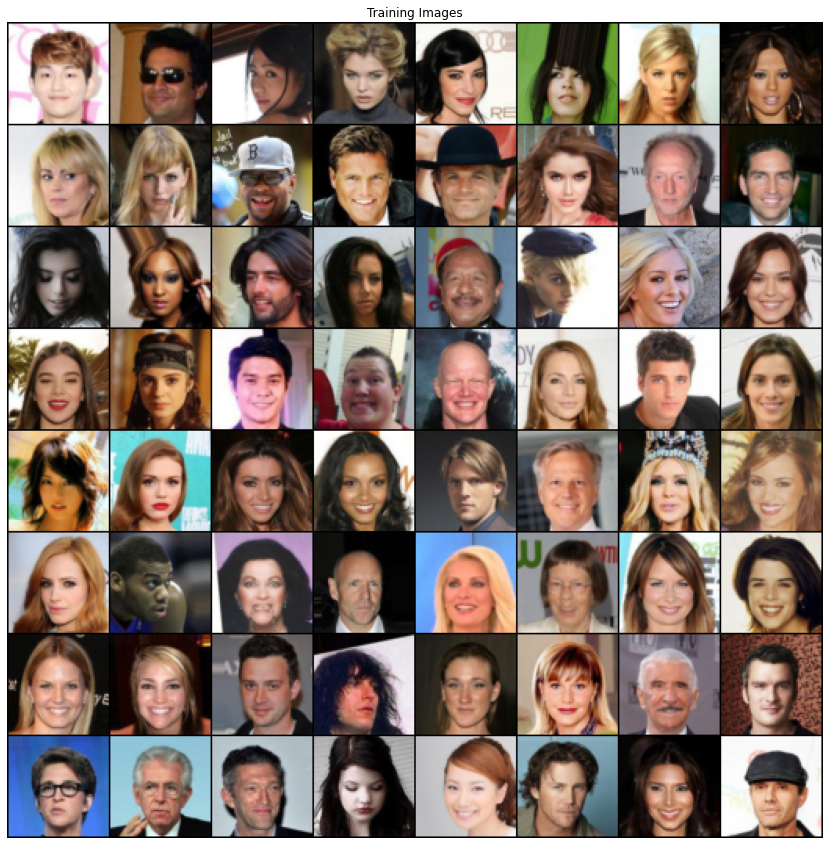

In [7]:
import matplotlib.pyplot as plt
import os



seed=0
torch.manual_seed(seed)
np.random.seed(seed)
device=0
if device>=0 and torch.cuda.is_available():
  cudnn.benchmark = True
  torch.cuda.device(device)
  torch.cuda.manual_seed(seed)
else: 
  device=-1

batch_size = 128
workers = 2

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers, drop_last = True)

# Affichage de quelques images
real_batch = next(iter(dataloader)) #real_batch est une liste de 2 tenseurs où le 1er correspond aux images, les second correspond aux labels (ici 0 partout)

plt.figure(figsize=(15,15))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=1, normalize=True).cpu(),(1,2,0)))
os.makedirs("drive/My Drive/genFaces",exist_ok=True)
plt.savefig("drive/My Drive/genFaces/train.png" ) # Pour sauvegarder l'image sur votre Google Drive 


In [8]:
!du -sh data/img_align_celeba/
%ls
%mkdir img

1.7G	data/img_align_celeba/
data/  drive/  sample_data/


Le réseau $D$ est un empilement de couches de convolution 2D avec batchNorm2D et activations RELU: 

In [9]:
nc = 3 # Nombre de canaux de l'entrée
ndf = 64 # Facteur du nombre de canaux de sortie des différentes couches de convolution


# Initialisation recommandee pour netG et netD dans DCGAN
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


netD = Discriminator().to(device)
netD.apply(weights_init)
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [10]:
nz=100  #Taille du vecteur z donné en entrée du générateur
ngf = 64 # Facteur du nombre de canaux de sortie des différentes couches de deconvolution

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)
netG = Generator().to(device)
netG.apply(weights_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


Donner la procédure d'entraînement de ces deux réseaux. L'optimisation se fera ADAM selon les deux coûts adverses du discriminateur et du générateur. Pour chaque nouveau batch d'images, on alterne les deux mises à jour suivantes, selon un batch de vecteurs $z$ tirés aléatoirement selon une loi normale centrée réduite (un nouveau batch de $z$ à chaque itération): 

1.   Un pas de gradient sur les paramètres du réseau D pour maximiser:  $log(D(x)) + log(1 - D(G(z)))$
2.   Un pas de gradient sur les paramètres du réseau G pour maximiser:  $log(D(G(z)))$ 


Afin de suivre l'évolution de l'apprentissage, on pourra logguer l'erreur du discriminateur relevée en 1, l'erreur du générateur relevée en 2, la moyenne des sorties du discriminateur sur les images réelles et la moyenne des sorties du discriminateur sur les images générées.

À la fin de chaque époque (i.e., lorsque l'on a itéré sur tous les batchs du DataLoader), on pourra enregistrer les images générées à partir d'un batch de vecteurs $z$ fixe dans le Google Drive pour observer l'évolution des capacités du générateur.  



In [11]:
def saveIntIm(z, name) : 
  img_list = []
  with torch.no_grad():
    netG.eval()
    fake = netG(z).detach().cpu()
  img=vutils.make_grid(fake, padding=2, normalize=True)
  img_list.append(img)
  plt.figure(figsize=(15,15))
  plt.axis("off")
  plt.title("Fake Images")
  plt.imshow(np.transpose(img.cpu(),(1,2,0)))
  plt.savefig(name)
  plt.clf()

noise = torch.randn(64, nz, 1, 1, device=device)
saveIntIm(noise, 'img/fake_in.png')

<Figure size 1080x1080 with 0 Axes>

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)
Generator(
  (main): Sequentia

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Epoch 20/50, Dloss is 269.97393798828125, Gloss is 12476.69921875
mean Real Discriminator is 141.0700225830078, mean Fake Discriminator is 128.90399169921875 



ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-14-9dab25d4f16e>", line 46, in <module>
    loss_d_fake = criterion(DXfake, torch.zeros((batch_size, 1)).to(device))
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py", line 1823, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'KeyboardInterrupt' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/ultratb.py", line 1132, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)
  File "/usr/local/lib/python3.7/d

KeyboardInterrupt: ignored

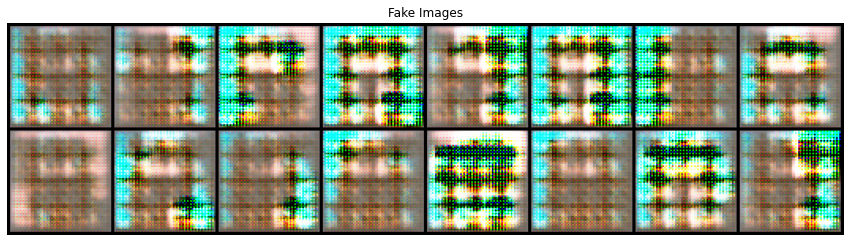

Error in callback <function flush_figures at 0x7febc66b40e0> (for post_execute):


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py", line 28, in trigger
    func(*args, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel/pylab/backend_inline.py", line 117, in flush_figures
    return show(True)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel/pylab/backend_inline.py", line 39, in show
    metadata=_fetch_figure_metadata(figure_manager.canvas.figure)
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/display.py", line 306, in display
    format_dict, md_dict = format(obj, include=include, exclude=exclude)
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/formatters.py", line 173, in format
    data = formatter(obj)
  File "<decorator-gen-2>", line 2, in __call__
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/formatters.py", line 217, in catch_format_error
    r = method(self, *args, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/IPython/cor

KeyboardInterrupt: ignored

In [ ]:
# Models parameters
nc = 3 # Nombre de canaux de l'entrée
ndf = 64 # Facteur du nombre de canaux de sortie des différentes couches de convolution
nz=100  #Taille du vecteur z donné en entrée du générateur
ngf = 64 # Facteur du nombre de canaux de sortie des différentes couches de deconvolution
netD = Discriminator().to(device)
netD.apply(weights_init)
print(netD)
netG = Generator().to(device)
netG.apply(weights_init)
print(netG)

# Training parameters 
nEpoch = 50
netGlr = 0.001
netGOptimizer = torch.optim.Adam(netG.parameters(), lr = netGlr)
netDlr = 0.001
netDOptimizer = torch.optim.Adam(netD.parameters(), lr = netDlr)
writer = SummaryWriter()
nbBatch = len(dataloader)
criterion = nn.BCELoss()

# Testing parameters 
nbTest = 16
zTest = torch.randn(nbTest, nz, 1, 1, device=device)

# Training procuedure
for epoch in range(nEpoch):
  lossesD = 0
  lossesG = 0
  realD = 0
  fakeD = 0
  for idx, (img, _) in enumerate(dataloader):

    # img is torch.Size([128, 3, 64, 64])
    img_GPU = img.to(device)

    z = torch.randn(batch_size, nz, 1, 1).to(device)
    Xfake = netG(z).to(device) # torch.Size([128, 3, 64, 64])
    DXfake = netD(Xfake.detach()).view(batch_size, 1).to(device) # [128, 1]
    DXreal = netD(img_GPU).view(batch_size, 1).to(device) # [128, 1]

    ###
    ### Discriminator
    ###
    loss_d_fake = criterion(DXfake, torch.zeros((batch_size, 1)).to(device)) 
    loss_d_real = criterion(DXreal, torch.ones((batch_size, 1)).to(device)) 
    loss_d = loss_d_real + loss_d_fake
    netDOptimizer.zero_grad()
    loss_d.backward() # we need to retain graph=True to be able to calculate the gradient in the g backprop
    netDOptimizer.step()

    DXfake = netD(Xfake).view(batch_size, 1).to(device)

    ###
    ### Generator
    ###
    loss_g = criterion(DXfake, torch.ones((batch_size, 1)).to(device))
    netGOptimizer.zero_grad()
    loss_g.backward()
    netGOptimizer.step()

    lossesD += loss_d
    lossesG += loss_g
    realD += loss_d_real
    fakeD += loss_d_fake    

  writer.add_scalar("LossD/train", lossesD/nbBatch, epoch)
  writer.add_scalar("LossG/train", lossesG/nbBatch, epoch)
  writer.add_scalar("MeanRealD/train", realD/nbBatch, epoch)
  writer.add_scalar("LossFakeD/train", fakeD/nbBatch, epoch)
  saveIntIm(zTest, f'img/GAN_fake_Epoch{epoch}.png')

  print(f'Epoch {epoch}/{nEpoch}, Dloss is {lossesD}, Gloss is {lossesG}')
  print(f'mean Real Discriminator is {realD}, mean Fake Discriminator is {fakeD} \n')

writer.flush()


In [ ]:
# %load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

Le code ci-dessous applique votre réseau à un batch de $z$ aléatoires et affiche les images générées (et enregistre dans fake.png). 

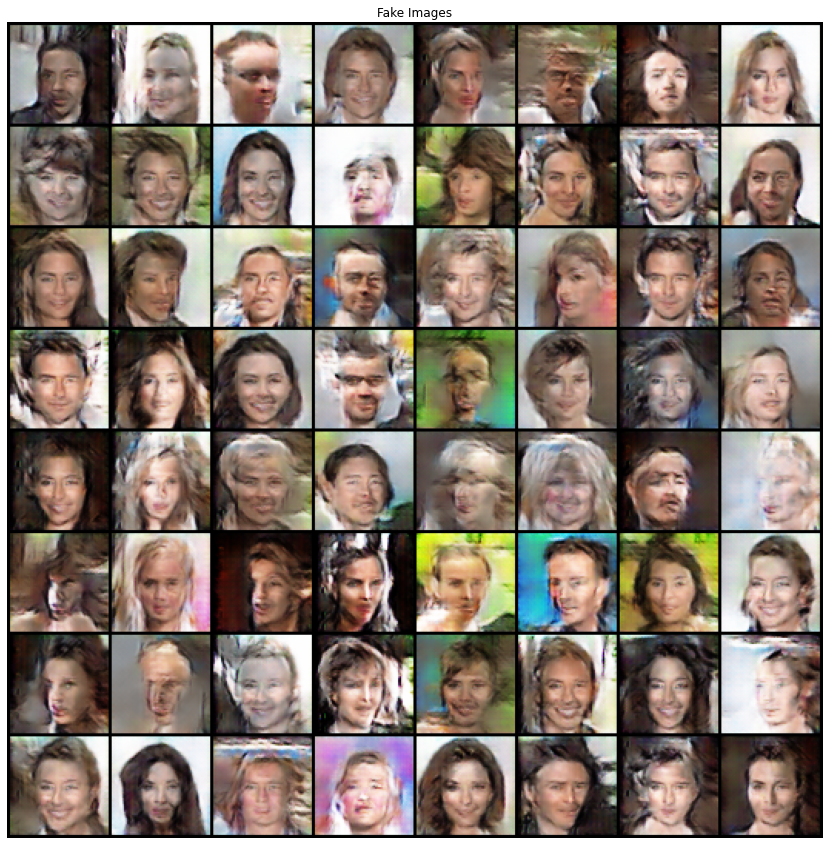

In [ ]:
noise = torch.randn(64, nz, 1, 1, device=device)
saveIntIm(noise, 'img/fake_out.png')

Le générateur du papier original DCGAN possède en fait l'architecture suivante: 

![Generator](https://pytorch.org/tutorials/_images/dcgan_generator.png)

Comme le réseau $G$ définit plus haut, il correspond à un empilement de couches de convolutions transposées (appelée dans certains papiers couches de déconvolution). Contrairement aux convolutions classiques qui mènent à une réduction de la taille des sorties, les convolutions transposées agrandissent les cartes de caractéristiques considérées (feature maps). C'est particulièrement adapté pour de la génération d'images à partir d'un code de petite taille (ici $z$). 

 Pour comprendre comment fonctionne la convolution transposée, voici un exemple simple avec une entrée 2 x 2 et un noyau 2 x 2. Chaque élément de l'entrée (4 éléments) est multiplié par le noyau et le résultat est ajouté à la sorte de taille 3 x 3: 

![BasicTransposeConv2D](http://d2l.ai/_images/trans-conv.svg)

Et voici deux animations pour se représenter l'opération d'une manière plus générale. A gauche on utilise un stride de 1, à droite un stride de 2: 

<p align="center">
<img src="https://i.stack.imgur.com/YyCu2.gif">
<img src="https://i.stack.imgur.com/f2RiP.gif">
</p>


Suivant la doc Pytorch de torch.nn.ConvTranspose2d, la hauteur $H_{out}$ et la largeur $W_{out}$ des cartes de sortie du ConvTranspose2d peuvent se calculer de la manière suivante: 

$H_{out}$=($H_{in}$−1)×stride−2×padding+dilation×(kernel_size−1)+output_padding+1

$W_{out}$=($W_{in}$−1)×stride−2×padding+dilation×(kernel_size−1)+output_padding+1


Proposer un nouveau réseau $G$ qui respecte l'architecture du schéma du papier DCGAN et comparer les résultats. On gardera le paramètre de dilation à sa valeur de 1 par défaut mais il est possible de moduler les valeurs de padding et output_padding pour obtenir des sorties de la taille désirée. 


La principale différence entre le générateur du papier original DCGAN et celui implémenté précédemment, est qu'il y a une couche supplémentaire avec 1024 canaux. 

In [12]:
nz=100  #Taille du vecteur z donné en entrée du générateur
ngf = 64 # Facteur du nombre de canaux de sortie des différentes couches de deconvolution

class GeneratorDCGAN(nn.Module):
    def __init__(self):
        super(GeneratorDCGAN, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),
            # state size. (ngf*16) x 4 x 4
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 8 x 8
            nn.ConvTranspose2d( ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 16 x 16
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            # state size. (ngf*2) x 32 x 32
            nn.ConvTranspose2d( ngf*2, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)
netG = GeneratorDCGAN().to(device)
netG.apply(weights_init)
print(netG)

GeneratorDCGAN(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Ta

In [ ]:
# data in case where mnist runs before
image_size = 64
dataset = dset.ImageFolder(root="data",
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

batch_size = 128
workers = 2

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers, drop_last = True)

# Models parameters
nc = 3 # Nombre de canaux de l'entrée
ndf = 64 # Facteur du nombre de canaux de sortie des différentes couches de convolution
nz=100  #Taille du vecteur z donné en entrée du générateur
ngf = 64 # Facteur du nombre de canaux de sortie des différentes couches de deconvolution
netD = Discriminator().to(device)
netD.apply(weights_init)
print(netD)
netG = GeneratorDCGAN().to(device)
netG.apply(weights_init)
print(netG)

# Training parameters 
nEpoch = 20
netGlr = 0.001
netGOptimizer = torch.optim.Adam(netG.parameters(), lr = netGlr)
netDlr = 0.001
netDOptimizer = torch.optim.Adam(netD.parameters(), lr = netDlr)
writer = SummaryWriter()
nbBatch = len(dataloader)
criterion = nn.BCELoss()

# Testing parameters 
nbTest = 16
zTest = torch.randn(nbTest, nz, 1, 1, device=device)

# Training procuedure
for epoch in range(nEpoch):
  lossesD = 0
  lossesG = 0
  realD = 0
  fakeD = 0
  for idx, (img, _) in enumerate(dataloader):

    # img is torch.Size([128, 3, 64, 64])
    img_GPU = img.to(device)

    z = torch.randn(batch_size, nz, 1, 1).to(device)
    Xfake = netG(z).to(device) # torch.Size([128, 3, 64, 64])
    DXfake = netD(Xfake.detach()).view(batch_size, 1).to(device) # [128, 1]
    DXreal = netD(img_GPU).view(batch_size, 1).to(device) # [128, 1]

    ###
    ### Discriminator
    ###
    loss_d_fake = criterion(DXfake, torch.zeros((batch_size, 1)).to(device)) 
    loss_d_real = criterion(DXreal, torch.ones((batch_size, 1)).to(device)) 
    loss_d = loss_d_real + loss_d_fake
    netDOptimizer.zero_grad()
    loss_d.backward() # we need to retain graph=True to be able to calculate the gradient in the g backprop
    netDOptimizer.step()

    DXfake = netD(Xfake).view(batch_size, 1).to(device)

    ###
    ### Generator
    ###
    loss_g = criterion(DXfake, torch.ones((batch_size, 1)).to(device))
    netGOptimizer.zero_grad()
    loss_g.backward()
    netGOptimizer.step()

    lossesD += loss_d
    lossesG += loss_g
    realD += loss_d_real
    fakeD += loss_d_fake    

  writer.add_scalar("LossD/train", lossesD/nbBatch, epoch)
  writer.add_scalar("LossG/train", lossesG/nbBatch, epoch)
  writer.add_scalar("MeanRealD/train", realD/nbBatch, epoch)
  writer.add_scalar("LossFakeD/train", fakeD/nbBatch, epoch)
  saveIntIm(zTest, f'img/DCGAN_fake_Epoch{epoch}.png')

  print(f'Epoch {epoch}/{nEpoch}, Dloss is {lossesD}, Gloss is {lossesG}')
  print(f'mean Real Discriminator is {realD}, mean Fake Discriminator is {fakeD} \n')

writer.flush()

noise = torch.randn(64, nz, 1, 1, device=device)
saveIntIm(noise, 'img/DCGAN_fake_out.png')

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)
GeneratorDCGAN(
  (main): Sequ

Bonus: Réaliser le même genre d'apprentissage sur le corpus Mnist (Dataloader existant dans torch pour télécharger et charger le corpus)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)
GeneratorDCGAN(
  (main): Sequent

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Epoch 20/30, Dloss is 133.12037658691406, Gloss is 2421.753173828125
mean Real Discriminator is 68.46302795410156, mean Fake Discriminator is 64.65740966796875 

Epoch 21/30, Dloss is 151.54263305664062, Gloss is 2537.1123046875
mean Real Discriminator is 76.40965270996094, mean Fake Discriminator is 75.13294219970703 

Epoch 22/30, Dloss is 199.9454803466797, Gloss is 2329.812255859375
mean Real Discriminator is 102.61051177978516, mean Fake Discriminator is 97.3351058959961 

Epoch 23/30, Dloss is 166.5863037109375, Gloss is 2342.51220703125
mean Real Discriminator is 83.81172943115234, mean Fake Discriminator is 82.77457427978516 

Epoch 24/30, Dloss is 196.69554138183594, Gloss is 2185.087158203125
mean Real Discriminator is 98.3097152709961, mean Fake Discriminator is 98.38592529296875 

Epoch 25/30, Dloss is 156.98831176757812, Gloss is 2141.85986328125
mean Real Discriminator is 80.12914276123047, mean Fake Discriminator is 76.85918426513672 

Epoch 26/30, Dloss is 208.532318115

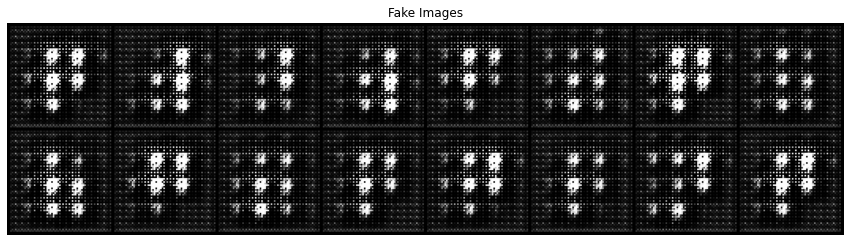

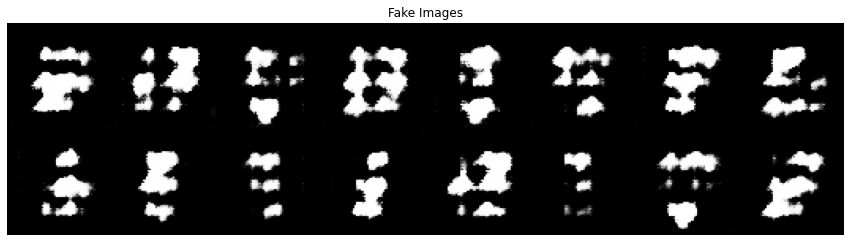

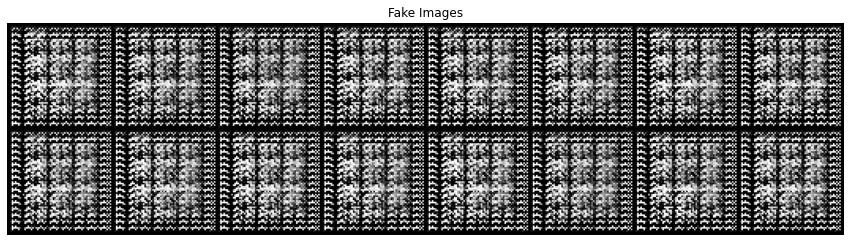

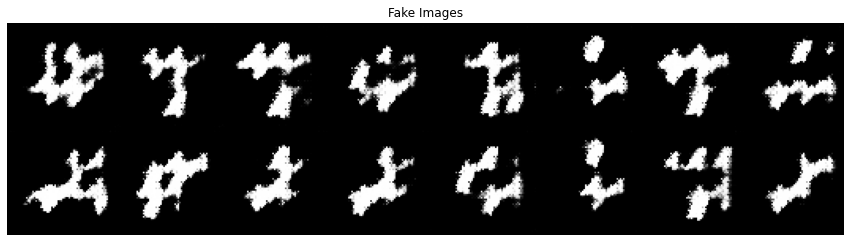

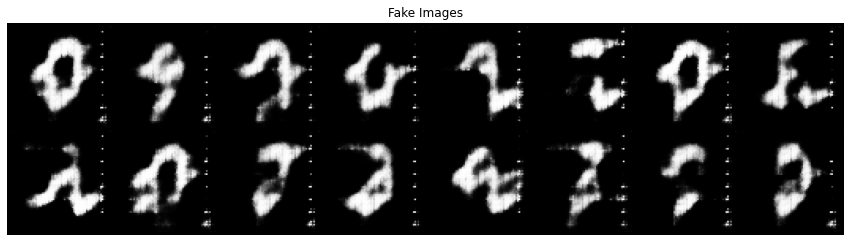

...

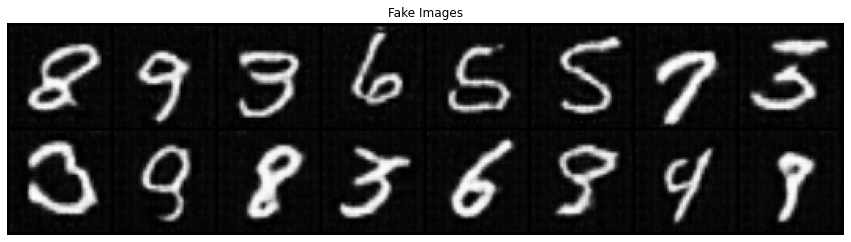

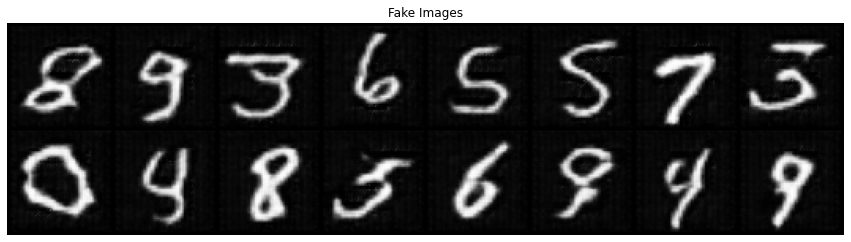

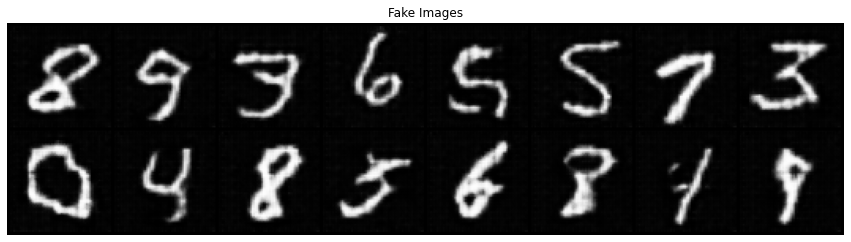

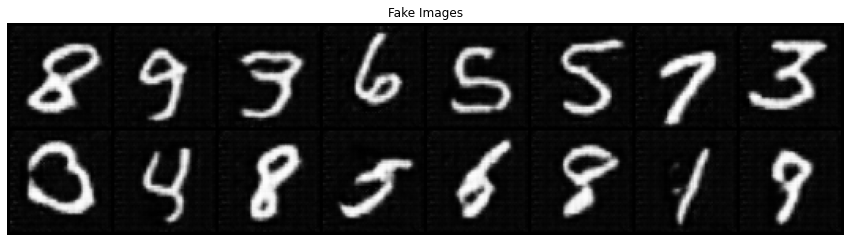

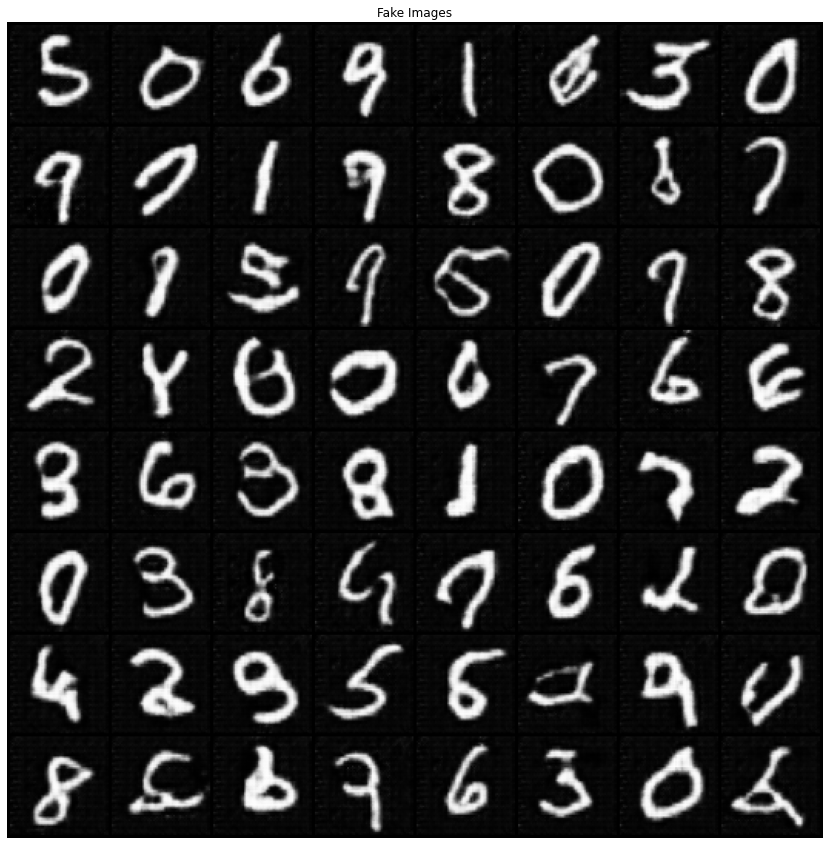

In [ ]:
# Dataset
batch_size = 128 # Images per batch

mytransform = transforms.Compose([transforms.Resize(64),
                                  transforms.ToTensor(),
                                 transforms.Normalize((.5), (.5))]) # normalize between [-1, 1] with tanh activation

mnist_train = torchvision.datasets.MNIST(root='.', download=True, transform=mytransform)
dataloader = torch.utils.data.DataLoader(dataset=mnist_train, 
                         batch_size=batch_size,
                         shuffle=True, 
                         drop_last=True)    

# Models parameters
nc = 1 # Nombre de canaux de l'entrée
ndf = 32 # Facteur du nombre de canaux de sortie des différentes couches de convolution
nz = 100  #Taille du vecteur z donné en entrée du générateur
ngf = 32 # Facteur du nombre de canaux de sortie des différentes couches de deconvolution
netD = Discriminator().to(device)
netD.apply(weights_init)
print(netD)
netG = GeneratorDCGAN().to(device)
netG.apply(weights_init)
print(netG)

# Training parameters 
nEpoch = 30
netGlr = 0.001
netGOptimizer = torch.optim.Adam(netG.parameters(), lr = netGlr)
netDlr = 0.001
netDOptimizer = torch.optim.Adam(netD.parameters(), lr = netDlr)
writer = SummaryWriter()
nbBatch = len(dataloader)
criterion = nn.BCELoss()

# Testing parameters 
nbTest = 16
zTest = torch.randn(nbTest, nz, 1, 1, device=device)

# Training procuedure
for epoch in range(nEpoch):
  lossesD = 0
  lossesG = 0
  realD = 0
  fakeD = 0
  for idx, (img, _) in enumerate(dataloader):

    # img is torch.Size([128, 1, 32, 32])
    img_GPU = img.to(device)

    z = torch.randn(batch_size, nz, 1, 1).to(device)
    Xfake = netG(z).to(device) # torch.Size([128, 1, 64, 64])
    DXfake = netD(Xfake.detach()).view(batch_size, 1).to(device) # [128, 1]
    DXreal = netD(img_GPU).view(batch_size, 1).to(device) # [128, 1]

    ###
    ### Discriminator
    ###
    loss_d_fake = criterion(DXfake, torch.zeros((batch_size, 1)).to(device)) 
    loss_d_real = criterion(DXreal, torch.ones((batch_size, 1)).to(device)) 
    loss_d = loss_d_real + loss_d_fake
    netDOptimizer.zero_grad()
    loss_d.backward() # we need to retain graph=True to be able to calculate the gradient in the g backprop
    netDOptimizer.step()

    DXfake = netD(Xfake).view(batch_size, 1).to(device)

    ###
    ### Generator
    ###
    loss_g = criterion(DXfake, torch.ones((batch_size, 1)).to(device))
    netGOptimizer.zero_grad()
    loss_g.backward()
    netGOptimizer.step()

    lossesD += loss_d
    lossesG += loss_g
    realD += loss_d_real
    fakeD += loss_d_fake    

  writer.add_scalar("LossD/train", lossesD/nbBatch, epoch)
  writer.add_scalar("LossG/train", lossesG/nbBatch, epoch)
  writer.add_scalar("MeanRealD/train", realD/nbBatch, epoch)
  writer.add_scalar("LossFakeD/train", fakeD/nbBatch, epoch)
  saveIntIm(zTest, f'img/MNIST_fake_Epoch{epoch}.png')

  print(f'Epoch {epoch}/{nEpoch}, Dloss is {lossesD}, Gloss is {lossesG}')
  print(f'mean Real Discriminator is {realD}, mean Fake Discriminator is {fakeD} \n')

writer.flush()
noise = torch.randn(64, nz, 1, 1, device=device)
saveIntIm(noise, 'img/MNIST_fake_out.png')